In [1]:
import pennylane as qml
from pennylane import numpy as np
import jax
import jax.numpy as jnp
from jax import jit
from matplotlib import pyplot as plt

import copy
import tqdm  # Pretty progress bars
import joblib  # Writing and loading


In [1]:
myvqe.save('./N'+str(N)+'n'+str(side)+'')

a


In [2]:
import sys
sys.path.insert(0, '../')

import hamiltonians as ham
import ising_chain as ic
import annni_model as annni
import vqe as vqe
import qcnn as qcnn
import visualization as qplt
import losses as losses

In [4]:
myvqe = vqe.load_vqe('../data/vqes/ANNNI/N'+str(N)+'n100')
myvqe.train_refine(.1, 1000, 0.01, assist = True)

  0%|          | 0/10000 [00:00<?, ?it/s]


KeyboardInterrupt



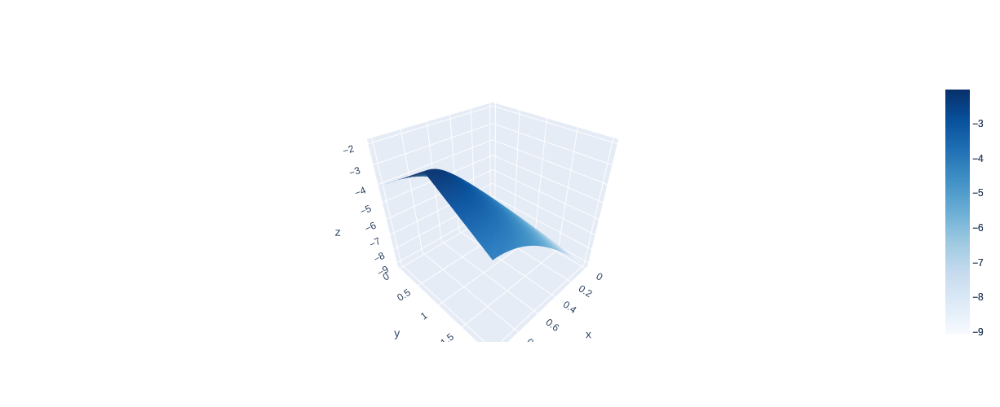

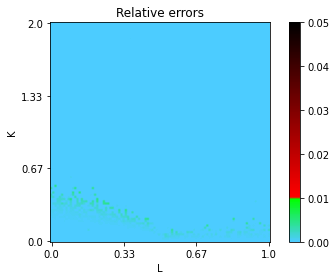

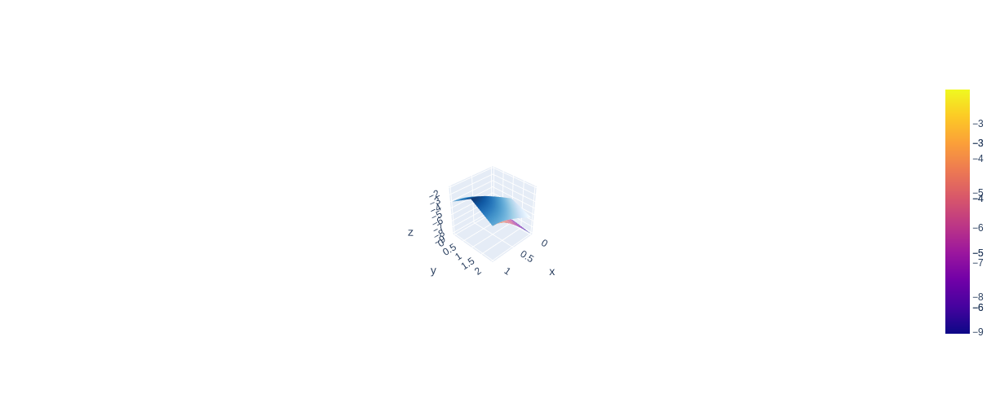

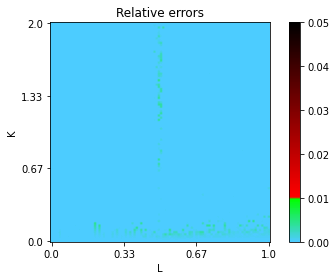

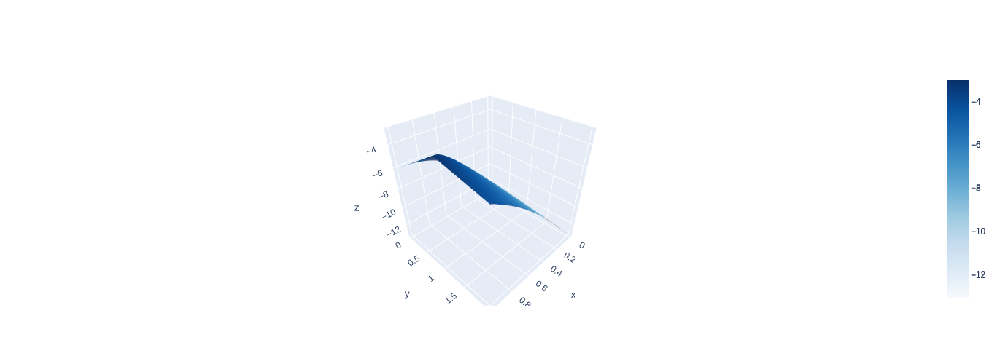

...

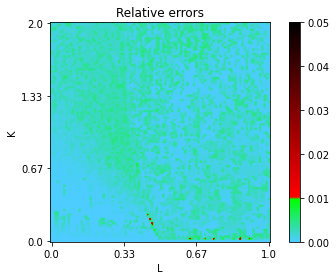

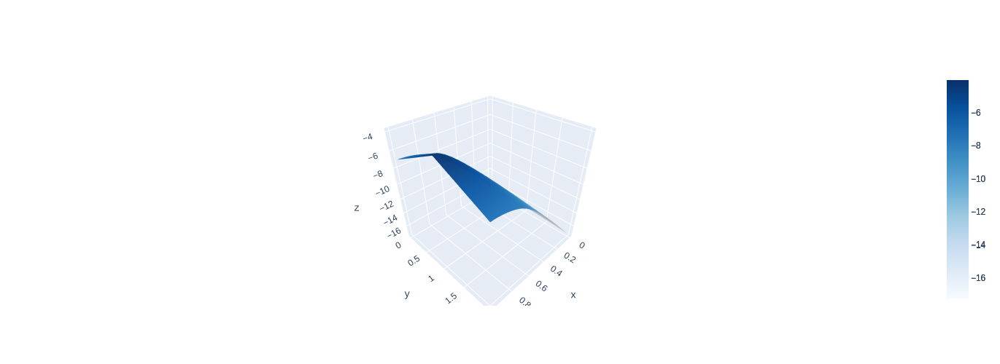

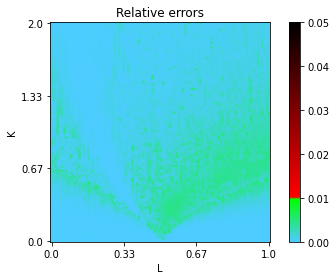

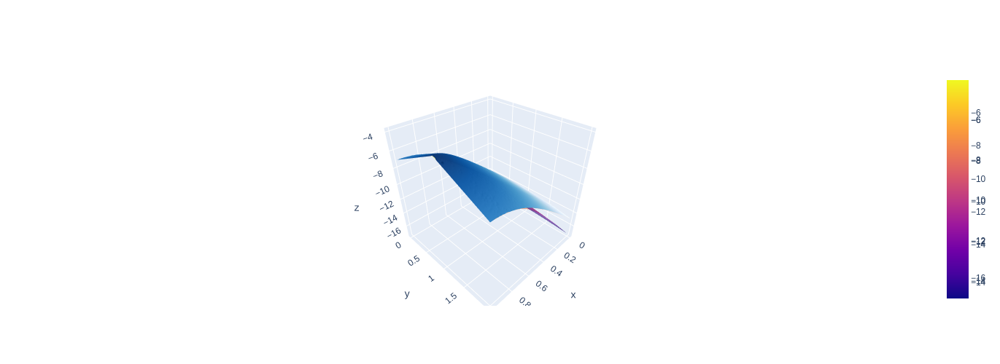

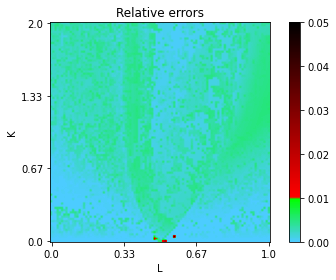

10 is missing


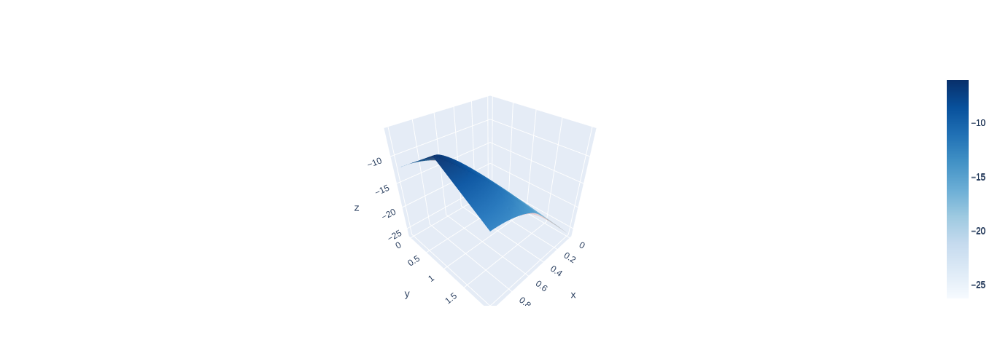

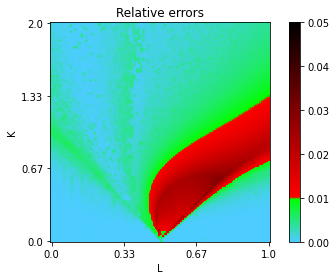

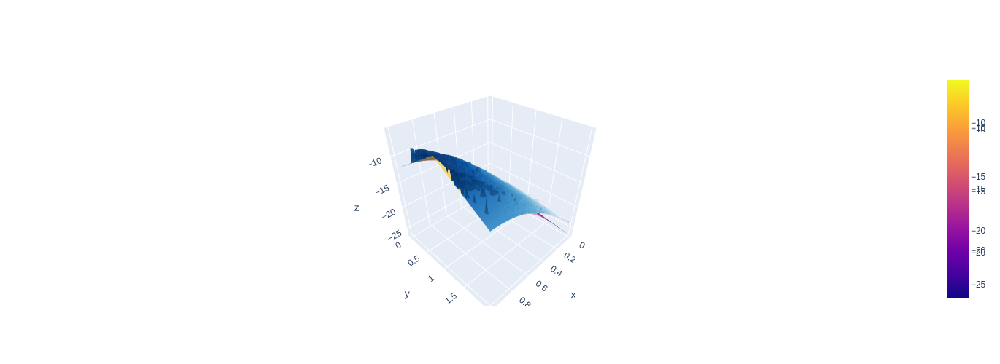

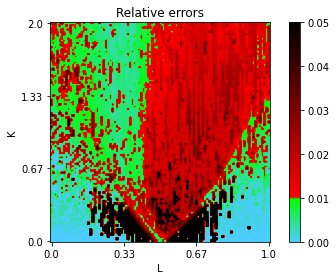

In [3]:
Ns = [4,6,8,10,12]

side = 100
train_index = np.arange(0,2*side-1)
vqes = []
for N in Ns:
    try:
        vqes.append(vqe.load_vqe('../data/vqes/ANNNI/N'+str(N)+'n100') )
        qplt.show_VQE_annni(vqes[-1])
        plt.show()
        qplt.show_VQE_annni(vqes[-1], excited = True)
        plt.show()
    except:
        print(N, 'is missing')
        


Cost: 0.2309204488992691: 100%|██████████| 10000/10000 [00:32<00:00, 305.42it/s]


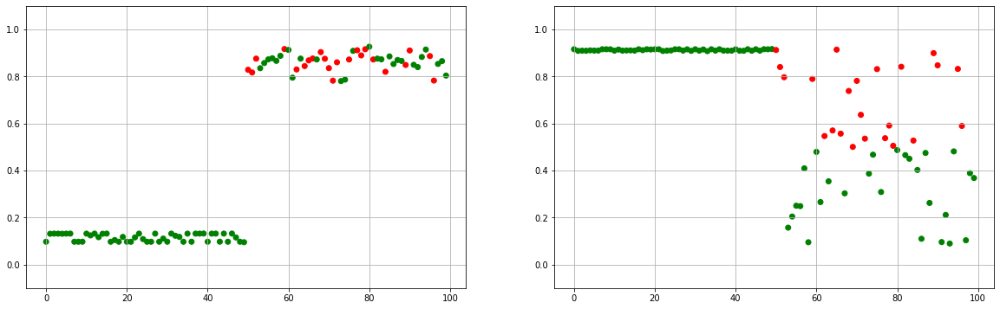

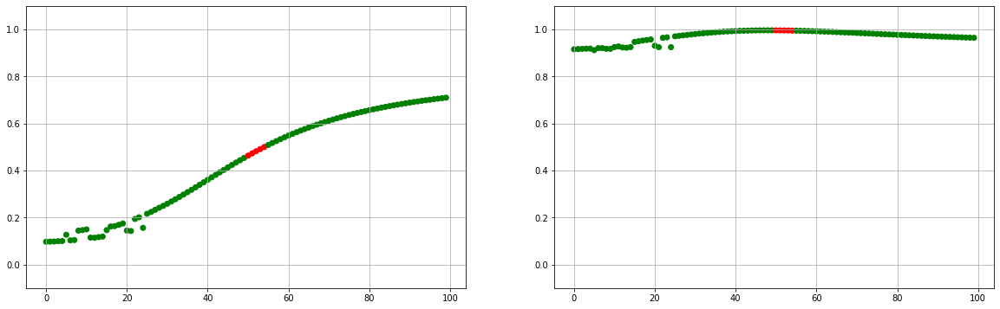

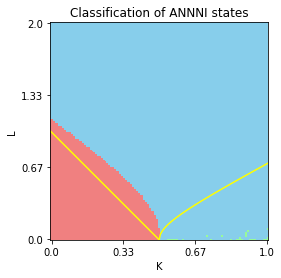

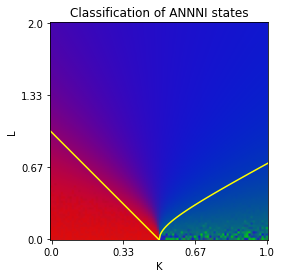

Cost: 0.19893300533294678:  55%|█████▌    | 5520/10000 [00:31<00:15, 291.29it/s]

In [ ]:
for myvqe in [vqes[0],vqes[1]]:
    myqcnn = qcnn.qcnn(myvqe, qcnn.qcnn_circuit, n_outputs = 2)
    myqcnn.train(1, 10000, train_index, losses.cross_entropy)
    qplt.show_QCNN_classification2D(myqcnn)
    qplt.show_QCNN_classificationANNNI(myqcnn, hard_thr = True)
    qplt.show_QCNN_classificationANNNI(myqcnn, hard_thr = False)